In [1]:
!pip install ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 843.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 5.2 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

print("YOLO Loaded Successfully")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO Loaded Successfully


In [3]:
from google.colab import files

uploaded = files.upload()

Saving videoplayback (2).mp4 to videoplayback (2).mp4


In [4]:
import os

print(os.listdir())

['.config', 'yolov8n.pt', 'videoplayback (2).mp4', 'sample_data']


In [5]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.predict(
    source="/content",
    save=True,
    conf=0.3
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 359.0ms
video 1/1 (frame 2/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 145.7ms
video 1/1 (frame 3/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 141.0ms
video 1/1 (frame 4/2685) /content/videoplayback (2).mp4: 384x640 2 persons, 143.5ms
video 1/1 (frame 5/2685) /content/videoplayback (2).mp4: 384x640 2 persons, 139.8ms
video 1/1 (frame 6/2

In [8]:
from IPython.display import Video

Video("/content/runs/detect/predict/videoplayback (2).mp4", embed=True)

In [10]:

import os

for root, dirs, files in os.walk("/content/runs/detect/predict"):
    for file in files:
        print(file)

videoplayback (2).avi


In [11]:
from IPython.display import Video

Video("/content/runs/detect/predict/videoplayback (2).mp4", embed=True)

In [12]:
from IPython.display import Video

Video("/content/runs/detect/predict/videoplayback (2).avi", embed=True)

Output hidden; open in https://colab.research.google.com to view.

In [13]:
from IPython.display import Video

Video("output.mp4", embed=True)

In [14]:
import os

file_path = "/content/runs/detect/predict/videoplayback (2).avi"

print("Exists:", os.path.exists(file_path))
print("Size:", os.path.getsize(file_path) if os.path.exists(file_path) else "Not Found")

Exists: True
Size: 138692364


In [15]:
!ffmpeg -i "/content/runs/detect/predict/videoplayback (2).avi" -vcodec libx264 output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [16]:
!ls -lh output.mp4

-rw-r--r-- 1 root root 16M Jun  1 10:42 output.mp4


In [17]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [18]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/videoplayback (2).mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.3
)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 771ms
Prepared 1 package in 276ms
Installed 1 package in 3ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 1.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 239.7ms
video 1/1 

In [19]:
import os

for root, dirs, files in os.walk("/content/runs/detect/track"):
    for file in files:
        print(file)

videoplayback (2).avi


In [20]:
!ffmpeg -i "/content/runs/detect/track/videoplayback (2).avi" tracked_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [21]:
!ls -lh tracked_output.mp4

-rw-r--r-- 1 root root 16M Jun  1 11:25 tracked_output.mp4


In [22]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('tracked_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [23]:
from ultralytics import YOLO
import pandas as pd

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/videoplayback (2).mp4",
    tracker="bytetrack.yaml",
    persist=True,
    stream=True
)

tracking_data = []

for frame_num, result in enumerate(results):

    if result.boxes.id is not None:

        boxes = result.boxes.xyxy.cpu().numpy()
        ids = result.boxes.id.cpu().numpy()

        for box, track_id in zip(boxes, ids):

            x1, y1, x2, y2 = box

            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2

            tracking_data.append([
                frame_num,
                int(track_id),
                center_x,
                center_y
            ])

df = pd.DataFrame(
    tracking_data,
    columns=["frame","player_id","x","y"]
)

df.to_csv("player_tracking.csv", index=False)

print(df.head())
print("CSV Saved")


video 1/1 (frame 1/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 289.0ms
video 1/1 (frame 2/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 246.1ms
video 1/1 (frame 3/2685) /content/videoplayback (2).mp4: 384x640 (no detections), 159.1ms
video 1/1 (frame 4/2685) /content/videoplayback (2).mp4: 384x640 3 persons, 158.1ms
video 1/1 (frame 5/2685) /content/videoplayback (2).mp4: 384x640 2 persons, 160.0ms
video 1/1 (frame 6/2685) /content/videoplayback (2).mp4: 384x640 2 persons, 155.6ms
video 1/1 (frame 7/2685) /content/videoplayback (2).mp4: 384x640 2 persons, 166.3ms
video 1/1 (frame 8/2685) /content/videoplayback (2).mp4: 384x640 4 persons, 1 bicycle, 154.5ms
video 1/1 (frame 9/2685) /content/videoplayback (2).mp4: 384x640 4 persons, 1 bicycle, 158.0ms
video 1/1 (frame 10/2685) /content/videoplayback (2).mp4: 384x640 4 persons, 1 bicycle, 154.7ms
video 1/1 (frame 11/2685) /content/videoplayback (2).mp4: 384x640 4 persons, 1 bicycle, 153.4ms
video 1/1 (

In [24]:
import pandas as pd
import numpy as np

df = pd.read_csv("player_tracking.csv")

distance_data = []

for player_id in df['player_id'].unique():

    player = df[df['player_id'] == player_id]

    total_distance = 0

    for i in range(1, len(player)):

        x1 = player.iloc[i-1]['x']
        y1 = player.iloc[i-1]['y']

        x2 = player.iloc[i]['x']
        y2 = player.iloc[i]['y']

        distance = np.sqrt((x2-x1)**2 + (y2-y1)**2)

        total_distance += distance

    distance_data.append([player_id, total_distance])

distance_df = pd.DataFrame(
    distance_data,
    columns=["player_id","distance_pixels"]
)

distance_df = distance_df.sort_values(
    by="distance_pixels",
    ascending=False
)

print(distance_df)

distance_df.to_csv("player_distance.csv", index=False)

print("Distance CSV Saved")

     player_id  distance_pixels
151        936      1852.474692
33         276      1154.989119
83         550       753.459342
208       1227       664.459547
387       2150       551.958034
..         ...              ...
352       1926         0.000000
340       1867         0.000000
326       1793         0.000000
411       2309         0.000000
4            7         0.000000

[420 rows x 2 columns]
Distance CSV Saved


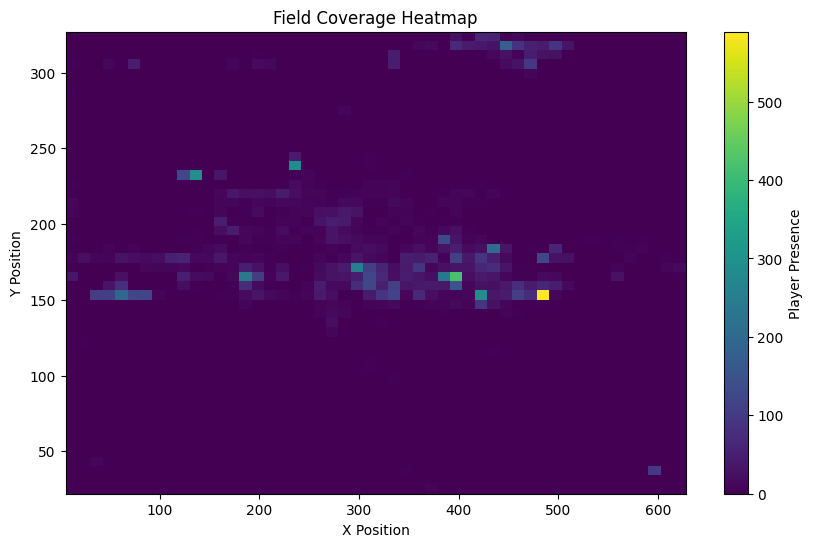

Heatmap Saved


In [25]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("player_tracking.csv")

plt.figure(figsize=(10,6))

plt.hist2d(
    df["x"],
    df["y"],
    bins=50
)

plt.colorbar(label="Player Presence")

plt.title("Field Coverage Heatmap")
plt.xlabel("X Position")
plt.ylabel("Y Position")

plt.savefig("field_heatmap.png")

plt.show()

print("Heatmap Saved")

In [26]:
import pandas as pd
import numpy as np

df = pd.read_csv("player_tracking.csv")

fps = 30  # Adjust if your video has a different FPS

speed_data = []

for player_id in df['player_id'].unique():

    player = df[df['player_id'] == player_id]

    total_distance = 0

    for i in range(1, len(player)):

        x1 = player.iloc[i-1]['x']
        y1 = player.iloc[i-1]['y']

        x2 = player.iloc[i]['x']
        y2 = player.iloc[i]['y']

        distance = np.sqrt((x2-x1)**2 + (y2-y1)**2)

        total_distance += distance

    total_time = len(player) / fps

    avg_speed = total_distance / total_time if total_time > 0 else 0

    speed_data.append([
        player_id,
        total_distance,
        avg_speed
    ])

speed_df = pd.DataFrame(
    speed_data,
    columns=[
        "player_id",
        "distance_pixels",
        "avg_speed_pixels_per_sec"
    ]
)

speed_df = speed_df.sort_values(
    by="avg_speed_pixels_per_sec",
    ascending=False
)

print(speed_df)

speed_df.to_csv("player_speed.csv", index=False)

print("Player Speed CSV Saved")

     player_id  distance_pixels  avg_speed_pixels_per_sec
158        963        48.771537                731.573050
260       1458        70.325614                703.256143
254       1429       212.013998                636.041993
179       1048        34.400447                516.006711
258       1454       154.541823                463.625470
..         ...              ...                       ...
162        972         0.000000                  0.000000
160        969         0.000000                  0.000000
49         373         0.000000                  0.000000
383       2130         0.000000                  0.000000
4            7         0.000000                  0.000000

[420 rows x 3 columns]
Player Speed CSV Saved


In [27]:
import pandas as pd

distance_df = pd.read_csv("player_distance.csv")
speed_df = pd.read_csv("player_speed.csv")

final_report = pd.merge(
    distance_df,
    speed_df[["player_id","avg_speed_pixels_per_sec"]],
    on="player_id"
)

final_report.columns = [
    "player_id",
    "distance_pixels",
    "avg_speed_pixels_per_sec"
]

final_report = final_report.sort_values(
    by="distance_pixels",
    ascending=False
)

print(final_report)

final_report.to_csv(
    "cricket_analytics_report.csv",
    index=False
)

print("Final Analytics Report Saved")

     player_id  distance_pixels  avg_speed_pixels_per_sec
0          936      1852.474692                159.696094
1          276      1154.989119                117.059708
2          550       753.459342                259.813566
3         1227       664.459547                203.405984
4         2150       551.958034                250.890015
..         ...              ...                       ...
399        328         0.000000                  0.000000
416       1867         0.000000                  0.000000
417       1793         0.000000                  0.000000
418       2309         0.000000                  0.000000
419          7         0.000000                  0.000000

[420 rows x 3 columns]
Final Analytics Report Saved


In [28]:
import os

for file in os.listdir():
    print(file)

.config
player_tracking.csv
player_distance.csv
field_heatmap.png
runs
player_speed.csv
yolov8n.pt
output.mp4
cricket_analytics_report.csv
videoplayback (2).mp4
tracked_output.mp4
sample_data


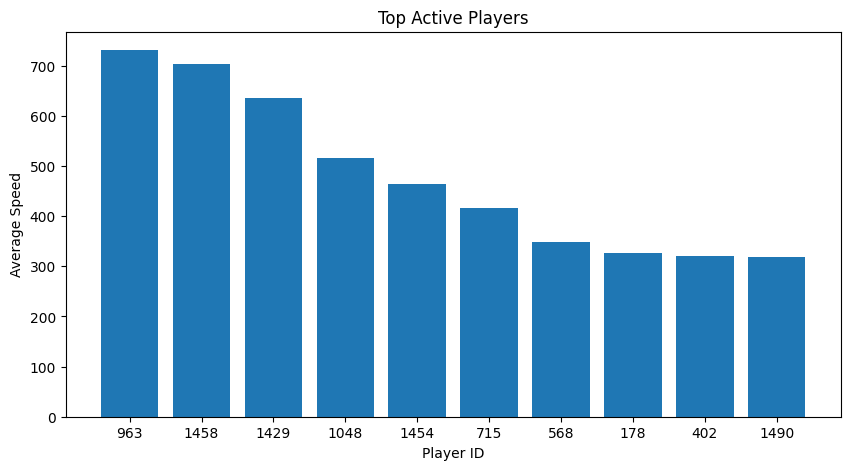

Chart Saved


In [29]:
import pandas as pd
import matplotlib.pyplot as plt

speed_df = pd.read_csv("player_speed.csv")

top_players = speed_df.head(10)

plt.figure(figsize=(10,5))
plt.bar(top_players["player_id"].astype(str),
        top_players["avg_speed_pixels_per_sec"])

plt.title("Top Active Players")
plt.xlabel("Player ID")
plt.ylabel("Average Speed")

plt.savefig("top_players_speed.png")

plt.show()

print("Chart Saved")

In [30]:
import pandas as pd

distance_df = pd.read_csv("player_distance.csv")
speed_df = pd.read_csv("player_speed.csv")

dashboard_df = pd.merge(
    distance_df,
    speed_df[["player_id", "avg_speed_pixels_per_sec"]],
    on="player_id"
)

dashboard_df["rank"] = dashboard_df["distance_pixels"].rank(
    ascending=False,
    method="dense"
)

dashboard_df = dashboard_df.sort_values(
    by="distance_pixels",
    ascending=False
)

dashboard_df.to_csv("dashboard_data.csv", index=False)

print(dashboard_df.head())
print("Dashboard Data Saved")

   player_id  distance_pixels  avg_speed_pixels_per_sec  rank
0        936      1852.474692                159.696094   1.0
1        276      1154.989119                117.059708   2.0
2        550       753.459342                259.813566   3.0
3       1227       664.459547                203.405984   4.0
4       2150       551.958034                250.890015   5.0
Dashboard Data Saved


In [31]:
from google.colab import files

files.download("cricket_analytics_report.csv")
files.download("player_tracking.csv")
files.download("player_distance.csv")
files.download("player_speed.csv")
files.download("dashboard_data.csv")
files.download("field_heatmap.png")
files.download("top_players_speed.png")
files.download("tracked_output.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
from google.colab import files

uploaded = files.upload()

Saving klvideo1.mp4 to klvideo1.mp4


In [33]:
import os
print(os.listdir())

['.config', 'player_tracking.csv', 'top_players_speed.png', 'player_distance.csv', 'klvideo1.mp4', 'field_heatmap.png', 'dashboard_data.csv', 'runs', 'player_speed.csv', 'yolov8n.pt', 'output.mp4', 'cricket_analytics_report.csv', 'videoplayback (2).mp4', 'tracked_output.mp4', 'sample_data']


In [34]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/klvideo1.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.3
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 183.2ms
video 1/1 (frame 2/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 164.7ms
video 1/1 (frame 3/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 153.0ms
video 1/1 (frame 4/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 175.0ms
video 1/1 (frame 5/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 154.0ms
video 1/

In [35]:
import os

for root, dirs, files in os.walk("/content/runs/detect"):
    for file in files:
        print(root, file)

/content/runs/detect/track videoplayback (2).avi
/content/runs/detect/track-2 klvideo1.avi
/content/runs/detect/predict videoplayback (2).avi


In [36]:
!find /content/runs -type f | grep -E "\.(avi|mp4)$"

/content/runs/detect/track/videoplayback (2).avi
/content/runs/detect/track-2/klvideo1.avi
/content/runs/detect/predict/videoplayback (2).avi


In [37]:
from IPython.display import HTML
from base64 import b64encode

video_path = "/content/klvideo1.mp4"

mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [38]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.predict(
    source="/content/klvideo1.mp4",
    save=True,
    conf=0.15
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 174.2ms
video 1/1 (frame 2/475) /content/klvideo1.mp4: 384x640 5 persons, 1 baseball bat, 157.9ms
video 1/1 (frame 3/475) /content/klvideo1.mp4: 384x640 5 persons, 1 baseball bat, 155.8ms
video 1/1 (frame 4/475) /content/klvideo1.mp4: 384x640 4 persons, 2 baseball bats, 155.2ms
video 1/1 (frame 5/475) /content/klvideo1.mp4: 384x640 4 persons, 1 baseball bat, 154.3ms
video 1

In [39]:
!find /content/runs/detect/predict-2 -type f

/content/runs/detect/predict-2/klvideo1.avi


In [40]:
from IPython.display import HTML
from base64 import b64encode

video_path = "/content/runs/detect/predict-2/klvideo1.mp4"

mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/predict-2/klvideo1.mp4'

In [41]:
!ffmpeg -i "/content/runs/detect/predict-2/klvideo1.avi" ball_detection.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [42]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('ball_detection.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [43]:
!pip install roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="f3VSKKdRzccFN7EHy5m9")

project = rf.workspace("kika12").project("cricket-ball-6gtio")

version = project.version(1)

dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.2/249.2 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 49.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 68.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.15
    Uninstalling idna-3.15:
      Successfully uninstalled idna-3.15


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Cricket-ball-1 in yolov8:: 100%|██████████| 182/182 [00:00<00:00, 4794.60it/s]


In [1]:
import os

print(os.listdir())

['.config', 'Cricket-ball-1', 'ball_detection.mp4', 'player_tracking.csv', 'top_players_speed.png', 'player_distance.csv', 'klvideo1.mp4', 'field_heatmap.png', 'dashboard_data.csv', 'runs', 'player_speed.csv', 'yolov8n.pt', 'output.mp4', 'cricket_analytics_report.csv', 'videoplayback (2).mp4', 'tracked_output.mp4', 'sample_data']


In [2]:
!ls Cricket-ball-1

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [3]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.train(
    data="/content/Cricket-ball-1/data.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    name="cricket_ball_detector"
)

Ultralytics 8.4.59 🚀 Python-3.12.13 torch-2.11.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Cricket-ball-1/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=cricket_ball_detector, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask

In [4]:
!find /content/runs -name "best.pt"

/content/runs/detect/cricket_ball_detector/weights/best.pt


In [5]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/cricket_ball_detector/weights/best.pt")

results = model.predict(
    source="/content/klvideo1.mp4",
    save=True,
    conf=0.25
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/475) /content/klvideo1.mp4: 384x640 (no detections), 253.9ms
video 1/1 (frame 2/475) /content/klvideo1.mp4: 384x640 (no detections), 140.3ms
video 1/1 (frame 3/475) /content/klvideo1.mp4: 384x640 (no detections), 144.6ms
video 1/1 (frame 4/475) /content/klvideo1.mp4: 384x640 (no detections), 140.8ms
video 1/1 (frame 5/475) /content/klvideo1.mp4: 384x640 (no detections), 138.7ms
video 1/1 (frame 6/475) /content/klvideo1.mp4: 384x640 (no

In [6]:
!find /content/runs/detect -type f | grep -E "\.(avi|mp4)$"

/content/runs/detect/track/videoplayback (2).avi
/content/runs/detect/track-2/klvideo1.avi
/content/runs/detect/predict-2/klvideo1.avi
/content/runs/detect/predict-3/klvideo1.avi
/content/runs/detect/predict/videoplayback (2).avi


In [7]:
!ffmpeg -i "/content/runs/detect/predict3/klvideo1.avi" cricket_ball_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [8]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('cricket_ball_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

FileNotFoundError: [Errno 2] No such file or directory: 'cricket_ball_output.mp4'

In [9]:
!find /content/runs/detect -type f | grep -E "\.(avi|mp4)$"

/content/runs/detect/track/videoplayback (2).avi
/content/runs/detect/track-2/klvideo1.avi
/content/runs/detect/predict-2/klvideo1.avi
/content/runs/detect/predict-3/klvideo1.avi
/content/runs/detect/predict/videoplayback (2).avi


In [10]:
!ffmpeg -i "/content/runs/detect/predict-3/klvideo1.avi" cricket_ball_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [11]:
!ls -lh cricket_ball_output.mp4

-rw-r--r-- 1 root root 2.0M Jun  1 13:26 cricket_ball_output.mp4


In [12]:
from IPython.display import Video

Video("cricket_ball_output.mp4", embed=True)

Output hidden; open in https://colab.research.google.com to view.

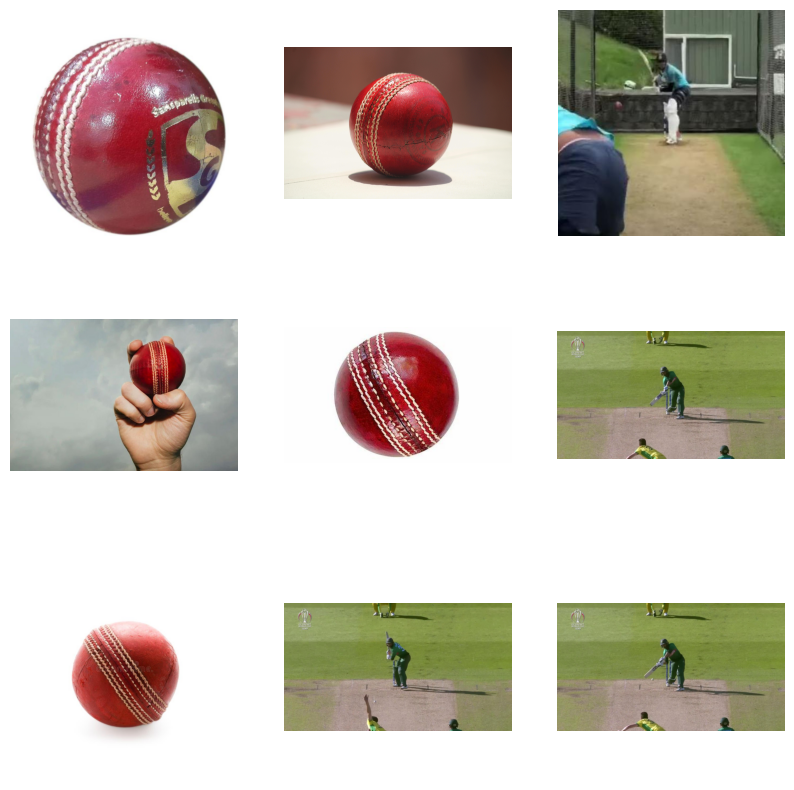

In [13]:
import os
from PIL import Image
import matplotlib.pyplot as plt

train_images = "/content/Cricket-ball-1/train/images"

images = os.listdir(train_images)[:9]

plt.figure(figsize=(10,10))

for i, img_name in enumerate(images):
    img = Image.open(os.path.join(train_images, img_name))

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()

In [14]:
import cv2
import os

video = cv2.VideoCapture("/content/klvideo1.mp4")

os.makedirs("ball_frames", exist_ok=True)

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 15 == 0:
        cv2.imwrite(f"ball_frames/frame_{saved}.jpg", frame)
        saved += 1

    count += 1

video.release()

print("Frames extracted:", saved)

Frames extracted: 32


In [15]:
import cv2
import os

video = cv2.VideoCapture("/content/klvideo1.mp4")

os.makedirs("ball_frames_more", exist_ok=True)

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 5 == 0:  # instead of 15
        cv2.imwrite(f"ball_frames_more/frame_{saved}.jpg", frame)
        saved += 1

    count += 1

video.release()

print("Frames extracted:", saved)

Frames extracted: 95


In [16]:
!zip -r ball_frames_more.zip ball_frames_more

  adding: ball_frames_more/ (stored 0%)
  adding: ball_frames_more/frame_33.jpg (deflated 0%)
  adding: ball_frames_more/frame_24.jpg (deflated 0%)
  adding: ball_frames_more/frame_18.jpg (deflated 0%)
  adding: ball_frames_more/frame_11.jpg (deflated 0%)
  adding: ball_frames_more/frame_87.jpg (deflated 0%)
  adding: ball_frames_more/frame_84.jpg (deflated 0%)
  adding: ball_frames_more/frame_75.jpg (deflated 1%)
  adding: ball_frames_more/frame_13.jpg (deflated 0%)
  adding: ball_frames_more/frame_65.jpg (deflated 1%)
  adding: ball_frames_more/frame_26.jpg (deflated 0%)
  adding: ball_frames_more/frame_81.jpg (deflated 0%)
  adding: ball_frames_more/frame_27.jpg (deflated 0%)
  adding: ball_frames_more/frame_56.jpg (deflated 0%)
  adding: ball_frames_more/frame_28.jpg (deflated 0%)
  adding: ball_frames_more/frame_16.jpg (deflated 0%)
  adding: ball_frames_more/frame_54.jpg (deflated 0%)
  adding: ball_frames_more/frame_2.jpg (deflated 0%)
  adding: ball_frames_more/frame_49.jpg (de

In [17]:
from google.colab import files
files.download("ball_frames_more.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
from google.colab import files
uploaded = files.upload()

Saving klmix1.MP4 to klmix1.MP4


In [2]:
import os
print(os.listdir())

['.config', 'klmix1.MP4', 'sample_data']


In [3]:
import cv2
import os

video = cv2.VideoCapture("/content/YOUR_VIDEO_NAME.mp4")

os.makedirs("ball_frames", exist_ok=True)

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 5 == 0:
        cv2.imwrite(f"ball_frames/frame_{saved}.jpg", frame)
        saved += 1

    count += 1

video.release()

print("Frames extracted:", saved)

Frames extracted: 0


In [4]:
import os
from PIL import Image
import matplotlib.pyplot as plt

images = os.listdir("ball_frames")[:9]

plt.figure(figsize=(10,10))

for i, img_name in enumerate(images):
    img = Image.open(os.path.join("ball_frames", img_name))

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()

<Figure size 1000x1000 with 0 Axes>

In [6]:
video = cv2.VideoCapture("/content/klmix1.mp4")

In [7]:
import cv2

video = cv2.VideoCapture("/content/klmix1.mp4")

print("Opened:", video.isOpened())

Opened: False


In [8]:
print(os.listdir("/content"))

['.config', 'ball_frames', 'klmix1.MP4', 'sample_data']


In [9]:
import cv2
import os

video = cv2.VideoCapture("/content/klmix1.MP4")

os.makedirs("ball_frames", exist_ok=True)

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 5 == 0:
        cv2.imwrite(f"ball_frames/frame_{saved}.jpg", frame)
        saved += 1

    count += 1

video.release()

print("Frames extracted:", saved)

Frames extracted: 403


In [10]:
!rm -rf ball_frames

In [11]:
import os
from PIL import Image
import matplotlib.pyplot as plt

images = os.listdir("ball_frames")[:9]

plt.figure(figsize=(10,10))

for i, img_name in enumerate(images):
    img = Image.open(os.path.join("ball_frames", img_name))

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'ball_frames'

In [12]:
import os

for item in os.listdir("/content"):
    print(item)

.config
klmix1.MP4
sample_data


In [13]:
import cv2
import os

video = cv2.VideoCapture("/content/klmix1.MP4")

print("Opened:", video.isOpened())

count = 0
while True:
    ret, frame = video.read()

    if not ret:
        break

    count += 1

video.release()

print("Total Frames:", count)

Opened: True
Total Frames: 2012


In [14]:
import cv2
import os

os.makedirs("ball_frames", exist_ok=True)

video = cv2.VideoCapture("/content/klmix1.MP4")

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 5 == 0:
        cv2.imwrite(f"ball_frames/frame_{saved}.jpg", frame)
        saved += 1

    count += 1

video.release()

print("Frames extracted:", saved)
print("Folder exists:", os.path.exists("ball_frames"))

Frames extracted: 403
Folder exists: True


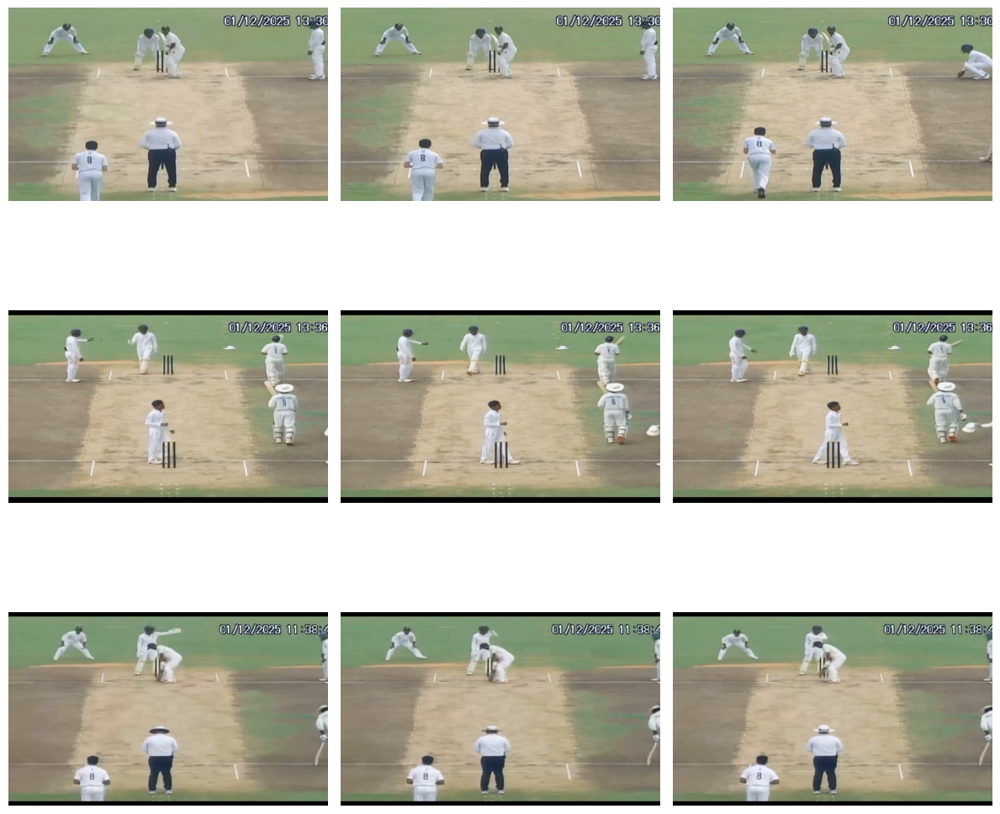

In [15]:
import os
from PIL import Image
import matplotlib.pyplot as plt

images = sorted(os.listdir("ball_frames"))[:9]

plt.figure(figsize=(12,12))

for i, img_name in enumerate(images):
    img = Image.open(os.path.join("ball_frames", img_name))

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

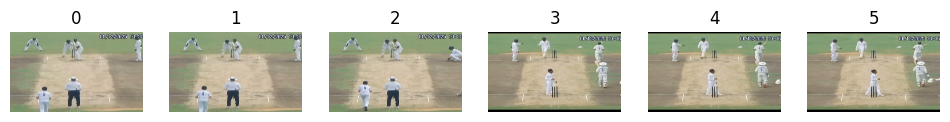

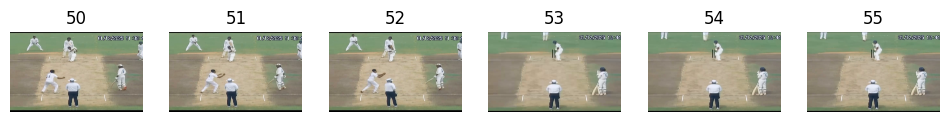

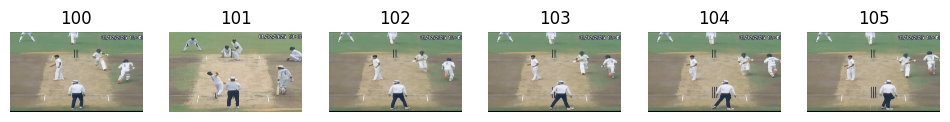

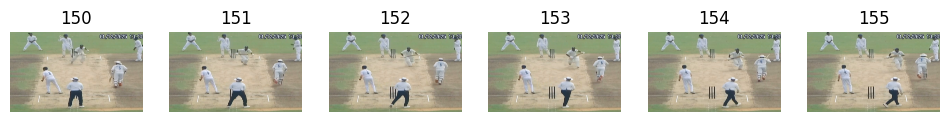

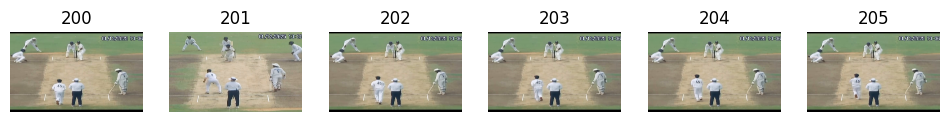

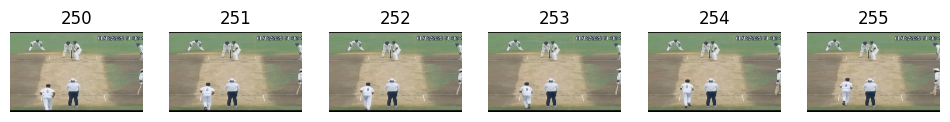

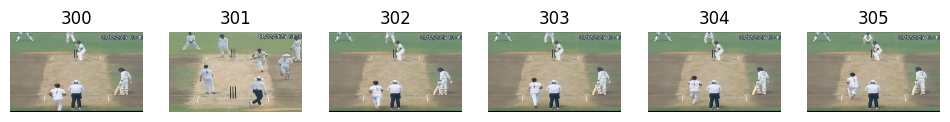

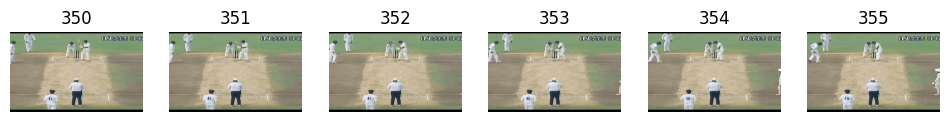

In [16]:
import os
from PIL import Image
import matplotlib.pyplot as plt

images = sorted(os.listdir("ball_frames"))

for start in [0, 50, 100, 150, 200, 250, 300, 350]:

    plt.figure(figsize=(12,4))

    for i in range(6):

        idx = start + i

        if idx >= len(images):
            break

        img = Image.open(
            os.path.join(
                "ball_frames",
                images[idx]
            )
        )

        plt.subplot(1,6,i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(idx)

    plt.show()

In [17]:
import os
from PIL import Image
import matplotlib.pyplot as plt

images = sorted(os.listdir("ball_frames"))

# Show frames every 25 images
for start in range(0, min(len(images), 400), 25):

    plt.figure(figsize=(15,3))

    for i in range(5):
        idx = start + i

        if idx >= len(images):
            break

        img = Image.open(
            os.path.join("ball_frames", images[idx])
        )

        plt.subplot(1,5,i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Frame {idx}")

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [18]:
import cv2
import os

video_path = "/content/klmix1.MP4"

cap = cv2.VideoCapture(video_path)

os.makedirs("all_frames", exist_ok=True)

frame_count = 0

while True:
    ret, frame = cap.read()

    if not ret:
        break

    cv2.imwrite(
        f"all_frames/frame_{frame_count:05d}.jpg",
        frame
    )

    frame_count += 1

cap.release()

print("Total Frames Extracted:", frame_count)

Total Frames Extracted: 2012


In [19]:
!zip -r all_frames.zip all_frames

  adding: all_frames/ (stored 0%)
  adding: all_frames/frame_01618.jpg (deflated 4%)
  adding: all_frames/frame_00752.jpg (deflated 4%)
  adding: all_frames/frame_00954.jpg (deflated 4%)
  adding: all_frames/frame_01274.jpg (deflated 3%)
  adding: all_frames/frame_00018.jpg (deflated 1%)
  adding: all_frames/frame_01895.jpg (deflated 4%)
  adding: all_frames/frame_01197.jpg (deflated 1%)
  adding: all_frames/frame_01108.jpg (deflated 0%)
  adding: all_frames/frame_00362.jpg (deflated 4%)
  adding: all_frames/frame_00042.jpg (deflated 1%)
  adding: all_frames/frame_01138.jpg (deflated 1%)
  adding: all_frames/frame_01772.jpg (deflated 4%)
  adding: all_frames/frame_01983.jpg (deflated 5%)
  adding: all_frames/frame_00216.jpg (deflated 4%)
  adding: all_frames/frame_00401.jpg (deflated 4%)
  adding: all_frames/frame_01117.jpg (deflated 0%)
  adding: all_frames/frame_00047.jpg (deflated 1%)
  adding: all_frames/frame_01680.jpg (deflated 5%)
  adding: all_frames/frame_01226.jpg (deflated 4

In [20]:
from google.colab import files

uploaded = files.upload()

Saving klnewvideo.MP4 to klnewvideo.MP4


In [21]:
import os

print(os.listdir("/content"))

['.config', 'ball_frames', 'klnewvideo.MP4', 'all_frames', 'klmix1.MP4', 'sample_data']


In [22]:
import cv2

video = cv2.VideoCapture("/content/klnewvideo.mp4")

print("Opened:", video.isOpened())

total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
fps = video.get(cv2.CAP_PROP_FPS)

print("Total Frames:", total_frames)
print("FPS:", fps)

video.release()

Opened: False
Total Frames: 0
FPS: 0.0


In [23]:
import cv2

video = cv2.VideoCapture("/content/klnewvideo.MP4")

print("Opened:", video.isOpened())

total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
fps = video.get(cv2.CAP_PROP_FPS)

print("Total Frames:", total_frames)
print("FPS:", fps)

video.release()

Opened: True
Total Frames: 1850
FPS: 30.0


In [24]:
import cv2
import os

os.makedirs("new_ball_frames", exist_ok=True)

video = cv2.VideoCapture("/content/klnewvideo.MP4")

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    cv2.imwrite(f"new_ball_frames/frame_{saved:04d}.jpg", frame)
    saved += 1

video.release()

print("Frames extracted:", saved)

Frames extracted: 1850


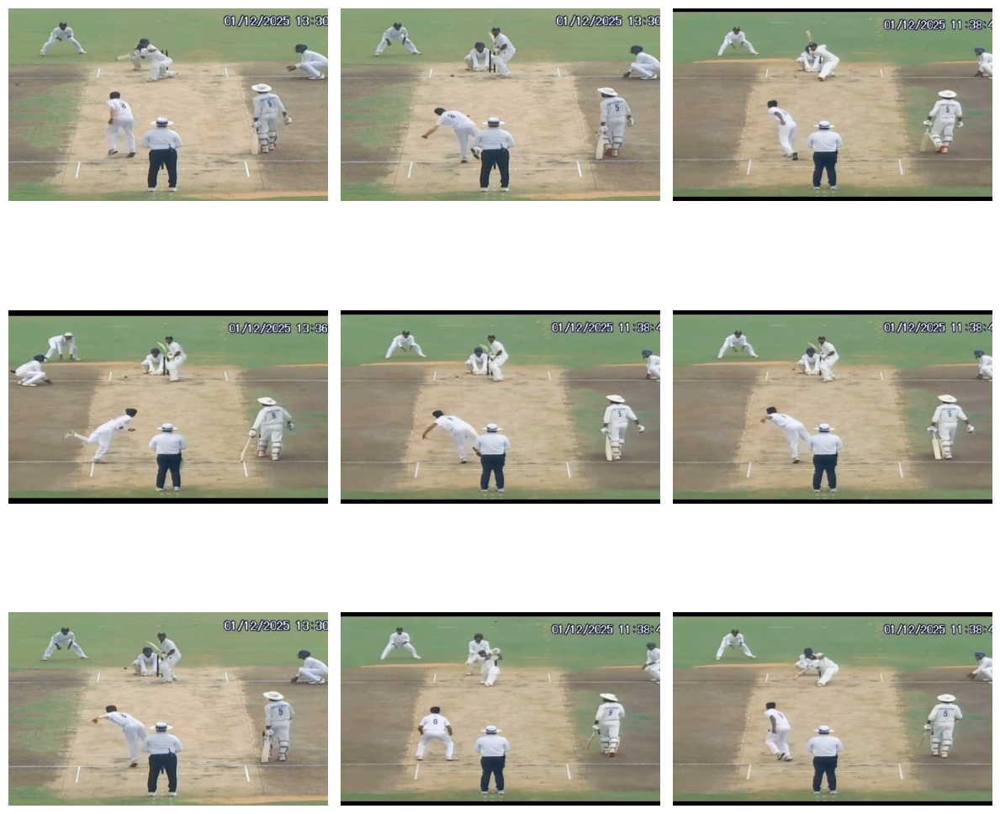

In [25]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import random

images = sorted(os.listdir("new_ball_frames"))

sample = random.sample(images, 9)

plt.figure(figsize=(12,12))

for i, img_name in enumerate(sample):
    img = Image.open(os.path.join("new_ball_frames", img_name))

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [26]:
import cv2
import os

os.makedirs("training_frames", exist_ok=True)

video = cv2.VideoCapture("/content/klnewvideo.MP4")

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 15 == 0:   # save every 15th frame
        cv2.imwrite(
            f"training_frames/frame_{saved:04d}.jpg",
            frame
        )
        saved += 1

    count += 1

video.release()

print("Frames saved:", saved)

Frames saved: 124


In [27]:
!zip -r training_frames.zip training_frames

  adding: training_frames/ (stored 0%)
  adding: training_frames/frame_0003.jpg (deflated 0%)
  adding: training_frames/frame_0067.jpg (deflated 2%)
  adding: training_frames/frame_0048.jpg (deflated 4%)
  adding: training_frames/frame_0114.jpg (deflated 2%)
  adding: training_frames/frame_0072.jpg (deflated 2%)
  adding: training_frames/frame_0043.jpg (deflated 4%)
  adding: training_frames/frame_0063.jpg (deflated 2%)
  adding: training_frames/frame_0035.jpg (deflated 0%)
  adding: training_frames/frame_0056.jpg (deflated 2%)
  adding: training_frames/frame_0030.jpg (deflated 0%)
  adding: training_frames/frame_0010.jpg (deflated 0%)
  adding: training_frames/frame_0059.jpg (deflated 2%)
  adding: training_frames/frame_0112.jpg (deflated 2%)
  adding: training_frames/frame_0053.jpg (deflated 2%)
  adding: training_frames/frame_0110.jpg (deflated 2%)
  adding: training_frames/frame_0075.jpg (deflated 2%)
  adding: training_frames/frame_0029.jpg (deflated 0%)
  adding: training_frames/

In [28]:
from google.colab import files
files.download("training_frames.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
import os

for file in os.listdir():
    print(file)

.config
sample_data


In [2]:
from google.colab import files

uploaded = files.upload()

Saving klnewvideo.MP4 to klnewvideo.MP4


In [3]:
import os
print(os.listdir("/content"))

['.config', 'klnewvideo.MP4', 'sample_data']


In [4]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.4 MB/s eta 0:00:00


In [5]:
from ultralytics import YOLO

print("YOLO Installed Successfully")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO Installed Successfully


In [6]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/klnewvideo.MP4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.3
)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 326ms
Prepared 1 package in 29ms
Installed 1 package in 2ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 0.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1850) /content/klnewvideo.MP4: 416x640 7 persons, 360.0ms
video 1/1 (frame 2/1850)

In [7]:
!find /content/runs/detect/track -type f

/content/runs/detect/track/klnewvideo.avi


In [8]:
!ffmpeg -i "/content/runs/detect/track/klnewvideo.avi" tracked_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [9]:
!ls -lh tracked_output.mp4

-rw-r--r-- 1 root root 30M Jun  2 04:47 tracked_output.mp4


In [11]:
!ls -lh tracked_output.mp4

-rw-r--r-- 1 root root 30M Jun  2 04:47 tracked_output.mp4


In [12]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('tracked_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [1]:
from ultralytics import YOLO
import pandas as pd

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/klnewvideo.MP4",
    tracker="bytetrack.yaml",
    persist=True
)

tracking_data = []

for frame_num, result in enumerate(results):

    if result.boxes.id is not None:

        boxes = result.boxes.xyxy.cpu().numpy()
        ids = result.boxes.id.cpu().numpy()

        for box, track_id in zip(boxes, ids):

            x1, y1, x2, y2 = box

            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2

            tracking_data.append(
                [frame_num, int(track_id), cx, cy]
            )

df = pd.DataFrame(
    tracking_data,
    columns=["Frame","Player_ID","X","Y"]
)

df.to_csv("player_tracking.csv", index=False)

print("CSV Saved")


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1850) /content/klnewvideo.MP4: 416x640 7 persons, 404.5ms
video 1/1 (frame 2/1850) /content/klnewvideo.MP4: 416x640 7 persons, 173.2ms
video 1/1 (frame 3/1850) /content/klnewvideo.MP4: 416x640 7 persons, 145.3ms
video 1/1 (frame 4/1850) /content/klnewvideo.MP4: 416x640 7 persons, 153.4ms
video 1/1 (frame 5/1850) /content/klnewvideo.MP4: 416x640 7 persons, 159.2ms
video 1/1 (frame 6/1850) /content/klnewvideo.MP4: 416x640 7 persons, 153.

In [2]:
import pandas as pd
import numpy as np

df = pd.read_csv("player_tracking.csv")

distance_data = []

for player_id in df["Player_ID"].unique():

    player = df[df["Player_ID"] == player_id]

    total_distance = 0

    for i in range(1, len(player)):

        x1, y1 = player.iloc[i-1][["X","Y"]]
        x2, y2 = player.iloc[i][["X","Y"]]

        dist = np.sqrt((x2-x1)**2 + (y2-y1)**2)

        total_distance += dist

    distance_data.append(
        [player_id, total_distance]
    )

distance_df = pd.DataFrame(
    distance_data,
    columns=["Player_ID","Distance"]
)

distance_df.to_csv(
    "player_distance.csv",
    index=False
)

print("Distance CSV Saved")

Distance CSV Saved


In [3]:
import pandas as pd
import numpy as np

df = pd.read_csv("player_tracking.csv")

speed_data = []

for player_id in df["Player_ID"].unique():

    player = df[df["Player_ID"] == player_id]

    for i in range(1, len(player)):

        x1, y1 = player.iloc[i-1][["X","Y"]]
        x2, y2 = player.iloc[i][["X","Y"]]

        speed = np.sqrt((x2-x1)**2 + (y2-y1)**2)

        speed_data.append(
            [player_id, player.iloc[i]["Frame"], speed]
        )

speed_df = pd.DataFrame(
    speed_data,
    columns=["Player_ID","Frame","Speed"]
)

speed_df.to_csv(
    "player_speed.csv",
    index=False
)

print("Player Speed CSV Saved")

Player Speed CSV Saved


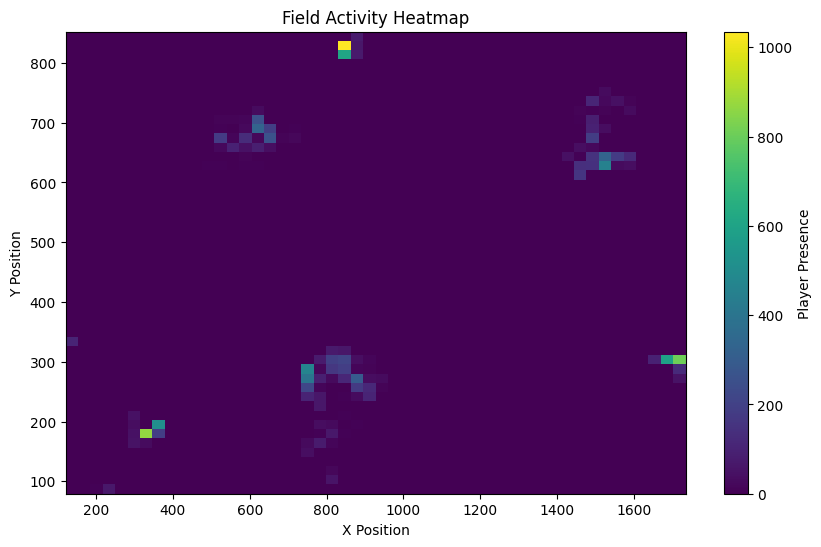

Heatmap Saved


In [4]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("player_tracking.csv")

plt.figure(figsize=(10,6))

plt.hist2d(
    df["X"],
    df["Y"],
    bins=50
)

plt.colorbar(label="Player Presence")

plt.title("Field Activity Heatmap")
plt.xlabel("X Position")
plt.ylabel("Y Position")

plt.savefig(
    "field_heatmap.png",
    bbox_inches="tight"
)

plt.show()

print("Heatmap Saved")

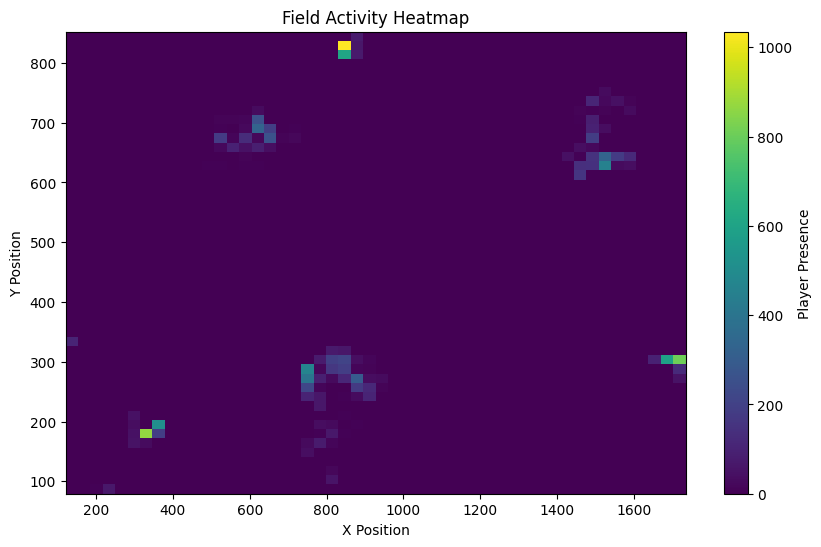

In [5]:
from PIL import Image
from IPython.display import display

display(Image.open("field_heatmap.png"))

In [6]:
import pandas as pd

distance_df = pd.read_csv("player_distance.csv")
speed_df = pd.read_csv("player_speed.csv")

avg_speed = speed_df.groupby("Player_ID")["Speed"].mean().reset_index()
avg_speed.columns = ["Player_ID", "Average_Speed"]

report = distance_df.merge(
    avg_speed,
    on="Player_ID",
    how="left"
)

report.to_csv(
    "cricket_analytics_report.csv",
    index=False
)

print("Final Analytics Report Saved")
print(report.head())

Final Analytics Report Saved
   Player_ID     Distance  Average_Speed
0          1  3208.404261       1.809591
1          2  2175.959671       5.399404
2          3   612.910852       0.968264
3          4  2550.106699       1.379182
4          5    70.581891       3.714836


In [7]:
from google.colab import files

files.download("tracked_output.mp4")
files.download("field_heatmap.png")
files.download("player_tracking.csv")
files.download("player_distance.csv")
files.download("player_speed.csv")
files.download("cricket_analytics_report.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [8]:
from google.colab import files

uploaded = files.upload()

Saving submangill.mp4 to submangill.mp4


In [9]:
import os

print(os.listdir("/content"))

['.config', 'player_distance.csv', 'yolov8n.pt', 'submangill.mp4', 'runs', 'field_heatmap.png', 'player_speed.csv', 'klnewvideo.MP4', 'player_tracking.csv', 'cricket_analytics_report.csv', 'tracked_output.mp4', 'sample_data']


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/submangill.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.3
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2878) /content/submangill.mp4: 384x640 1 person, 1 truck, 346.7ms
video 1/1 (frame 2/2878) /content/submangill.mp4: 384x640 1 person, 1 truck, 235.6ms
video 1/1 (frame 3/2878) /content/submangill.mp4: 384x640 1 person, 1 truck, 213.2ms
video 1/1 (frame 4/2878) /content/submangill.mp4: 384x640 1 person, 1 truck, 218.5ms
video 1/1 (frame 5/2878) /content/submangill.mp4: 384x640 1 person, 1 truck, 1 frisbee, 247.3ms
video 1/1 (frame 6/287

In [2]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/submangill.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    imgsz=480
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2878) /content/submangill.mp4: 288x480 1 person, 243.9ms
video 1/1 (frame 2/2878) /content/submangill.mp4: 288x480 1 person, 3095.4ms
video 1/1 (frame 3/2878) /content/submangill.mp4: 288x480 1 person, 772.5ms
video 1/1 (frame 4/2878) /content/submangill.mp4: 288x480 1 person, 21374.1ms
WARNING ⚠️ NMS time limit 2.050s exceeded
video 1/1 (frame 5/2878) /content/submangill.mp4: 288x480 1 person, 17235.1ms
video 1/1 (frame 6/2878) /conte

KeyboardInterrupt: 

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/submangill.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.5,
    imgsz=320,
    classes=[0],  # persons only
    vid_stride=3
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs



In [1]:
from google.colab import files

uploaded = files.upload()

Saving clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4 to clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4


In [2]:
import os

print(os.listdir("/content"))

['.config', 'clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4', 'sample_data']


In [3]:
print(os.listdir("/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4"))

FileNotFoundError: [Errno 2] No such file or directory: '/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4'

In [4]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0]   # persons only
)

ModuleNotFoundError: No module named 'ultralytics'

In [5]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.7 MB/s eta 0:00:00


In [6]:
from ultralytics import YOLO

print("YOLO Installed Successfully")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO Installed Successfully


In [7]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0],
    imgsz=320,
    vid_stride=3
)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 706ms
Prepared 1 package in 108ms
Installed 1 package in 19ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 1.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/453) /content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4: 192x320 1 pers

In [8]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0],
    imgsz=320,
    vid_stride=3
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/453) /content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4: 192x320 1 person, 131.5ms
video 1/1 (frame 2/453) /content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4: 192x320 1 person, 95.1ms
video 1/1 (frame 3/453) /content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4: 192x320 1 person, 82.5ms
video 1/1 (frame 4/453) /content/clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4: 192x320 1 person, 162.6ms
video 1/1 (frame

In [9]:
!find /content/runs/detect/track-2 -type f

/content/runs/detect/track-2/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi


In [11]:
!ffmpeg -i "/content/runs/detect/track-2/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi" tracked_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [13]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("tracked_output.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [14]:
import cv2

video = cv2.VideoCapture("/content/tracked_output.mp4")

ret, frame = video.read()

cv2.imwrite("sample_frame.jpg", frame)

video.release()

print("Frame Saved")

Frame Saved


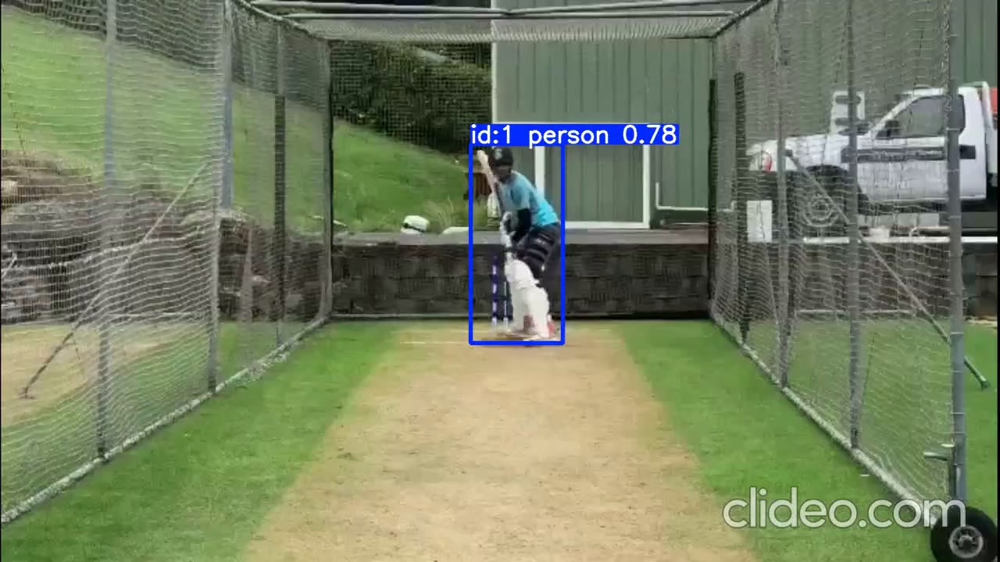

In [15]:
from PIL import Image
from IPython.display import display

display(Image.open("sample_frame.jpg"))

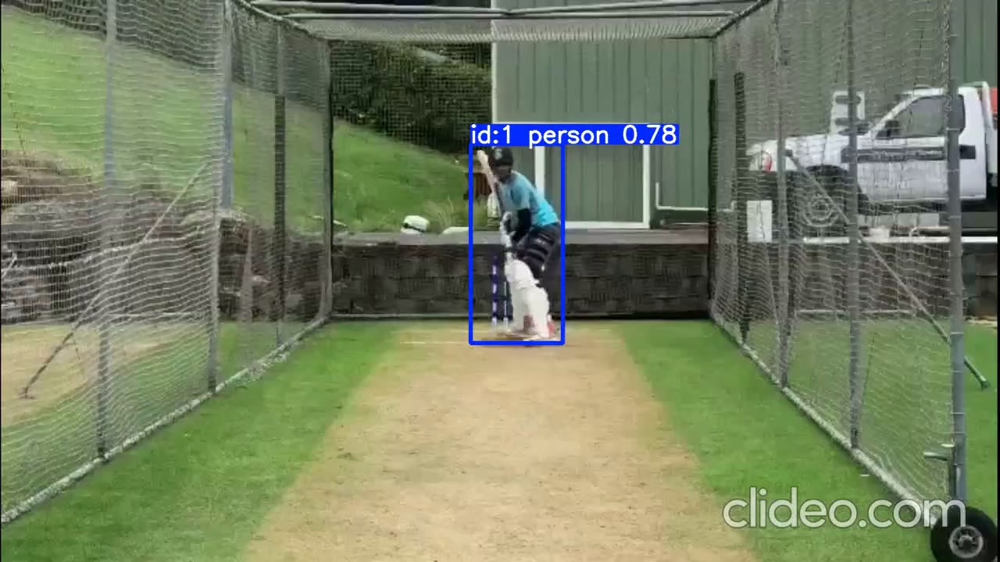

In [16]:
from PIL import Image
from IPython.display import display

display(Image.open("sample_frame.jpg"))

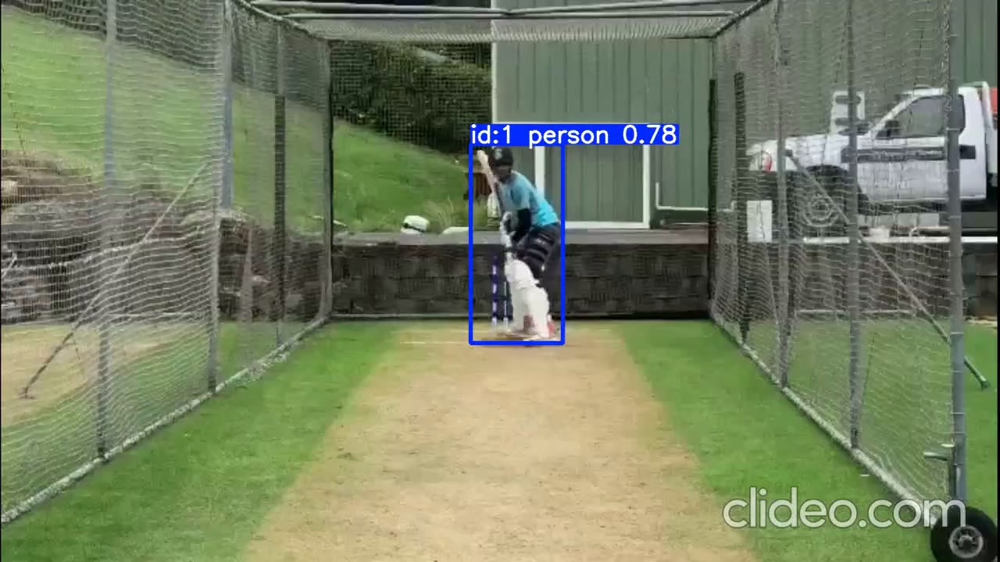

In [17]:
from PIL import Image
from IPython.display import display

display(Image.open("sample_frame.jpg"))

In [18]:
from google.colab import files

uploaded = files.upload()

Saving 0603.mp4 to 0603.mp4


In [19]:
import os

print(os.listdir("/content"))

['.config', 'tracked_output.mp4', 'yolov8n.pt', '0603.mp4', 'clideo_editor_191b670c203b4e50b4f9698e124a9f52.mp4', 'runs', 'sample_frame.jpg', 'sample_data']


In [20]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/0603.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0],      # persons only
    imgsz=320,        # faster
    vid_stride=3      # process every 3rd frame
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/413) /content/0603.mp4: 192x320 1 person, 81.3ms
video 1/1 (frame 2/413) /content/0603.mp4: 192x320 1 person, 47.9ms
video 1/1 (frame 3/413) /content/0603.mp4: 192x320 1 person, 50.6ms
video 1/1 (frame 4/413) /content/0603.mp4: 192x320 1 person, 49.8ms
video 1/1 (frame 5/413) /content/0603.mp4: 192x320 1 person, 170.4ms
video 1/1 (frame 6/413) /content/0603.mp4: 192x320 1 person, 289.4ms
video 1/1 (frame 7/413) /content/0603.mp4: 192x3

In [21]:
!find /content/runs/detect -name "*.avi"

/content/runs/detect/track-3/0603.avi
/content/runs/detect/track-2/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi
/content/runs/detect/track/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi


In [22]:
!find /content/runs/detect -type f

/content/runs/detect/track-3/0603.avi
/content/runs/detect/track-2/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi
/content/runs/detect/track/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi


In [23]:
!ffmpeg -i "/content/runs/detect/track-3/0603.avi" tracked_0603.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [24]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("tracked_0603.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [25]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/0603.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0],
    imgsz=320,
    vid_stride=1
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 192x320 1 person, 215.9ms
video 1/1 (frame 2/1241) /content/0603.mp4: 192x320 1 person, 103.9ms
video 1/1 (frame 3/1241) /content/0603.mp4: 192x320 1 person, 162.5ms
video 1/1 (frame 4/1241) /content/0603.mp4: 192x320 1 person, 160.6ms
video 1/1 (frame 5/1241) /content/0603.mp4: 192x320 1 person, 191.7ms
video 1/1 (frame 6/1241) /content/0603.mp4: 192x320 1 person, 140.9ms
video 1/1 (frame 7/1241) /content/0603

In [26]:
import pandas as pd
import numpy as np

df = pd.read_csv("player_tracking_0603.csv")

distance_data = []

for player_id in df["Player_ID"].unique():

    player = df[df["Player_ID"] == player_id]

    total_distance = 0

    for i in range(1, len(player)):

        x1, y1 = player.iloc[i-1][["X","Y"]]
        x2, y2 = player.iloc[i][["X","Y"]]

        dist = np.sqrt((x2-x1)**2 + (y2-y1)**2)

        total_distance += dist

    distance_data.append(
        [player_id, total_distance]
    )

distance_df = pd.DataFrame(
    distance_data,
    columns=["Player_ID","Distance"]
)

distance_df.to_csv(
    "player_distance_0603.csv",
    index=False
)

print(distance_df.head())
print("Distance Analysis Completed")

FileNotFoundError: [Errno 2] No such file or directory: 'player_tracking_0603.csv'

In [27]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("tracked_0603.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=900 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [28]:
vid_stride=3

In [29]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.track(
    source="/content/0603.mp4",
    tracker="bytetrack.yaml",
    save=True,
    persist=True,
    conf=0.4,
    classes=[0],
    imgsz=320,
    vid_stride=1
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 192x320 1 person, 66.0ms
video 1/1 (frame 2/1241) /content/0603.mp4: 192x320 1 person, 61.4ms
video 1/1 (frame 3/1241) /content/0603.mp4: 192x320 1 person, 60.7ms
video 1/1 (frame 4/1241) /content/0603.mp4: 192x320 1 person, 57.8ms
video 1/1 (frame 5/1241) /content/0603.mp4: 192x320 1 person, 51.9ms
video 1/1 (frame 6/1241) /content/0603.mp4: 192x320 1 person, 53.8ms
video 1/1 (frame 7/1241) /content/0603.mp4: 

In [30]:
!find /content/runs/detect/track-5 -name "*.avi"

/content/runs/detect/track-5/0603.avi


In [31]:
!ffmpeg -i "/content/runs/detect/track-5/0603.avi" tracked_0603_normal.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [32]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("tracked_0603_normal.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=900 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [33]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.predict(
    source="/content/0603.mp4",
    save=True,
    conf=0.2
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 2 persons, 350.1ms
video 1/1 (frame 2/1241) /content/0603.mp4: 384x640 2 persons, 275.7ms
video 1/1 (frame 3/1241) /content/0603.mp4: 384x640 2 persons, 307.7ms
video 1/1 (frame 4/1241) /content/0603.mp4: 384x640 2 persons, 353.8ms
video 1/1 (frame 5/1241) /content/0603.mp4: 384x640 2 persons, 234.6ms
video 1/1 (frame 6/1241) /content/0603.mp4: 384x640 2 persons, 160.6ms
video 1/1 (frame 7/1241) /conten

In [34]:
!find /content/runs/detect -type f

/content/runs/detect/track-3/0603.avi
/content/runs/detect/predict/0603.avi
/content/runs/detect/track-2/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi
/content/runs/detect/track-4/0603.avi
/content/runs/detect/track-5/0603.avi
/content/runs/detect/track/clideo_editor_191b670c203b4e50b4f9698e124a9f52.avi


In [35]:
!ffmpeg -i "/content/runs/detect/predict/0603.avi" detect_0603.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [36]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("detect_0603.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=900 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

Output hidden; open in https://colab.research.google.com to view.

In [40]:
import cv2
import os

video = cv2.VideoCapture("/content/0603.mp4")

os.makedirs("cricket_dataset_frames", exist_ok=True)

count = 0
saved = 0

while True:
    ret, frame = video.read()

    if not ret:
        break

    if count % 5 == 0:
        cv2.imwrite(
            f"cricket_dataset_frames/frame_{saved:04d}.jpg",
            frame
        )
        saved += 1

    count += 1

video.release()

print("Frames Saved:", saved)

Frames Saved: 249


In [41]:
import os

print("Total Images:",
      len(os.listdir("cricket_dataset_frames")))

Total Images: 249


In [42]:
from google.colab import files

files.download("cricket_dataset_frames.zip")

FileNotFoundError: Cannot find file: cricket_dataset_frames.zip

In [43]:
import os

print(os.path.exists("cricket_dataset_frames"))

True


In [44]:
print(len(os.listdir("cricket_dataset_frames")))

249


In [45]:
!zip -r cricket_dataset_frames.zip cricket_dataset_frames

  adding: cricket_dataset_frames/ (stored 0%)
  adding: cricket_dataset_frames/frame_0047.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0247.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0051.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0229.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0101.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0043.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0237.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0220.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0121.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0239.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0219.jpg (deflated 0%)
  adding: cricket_dataset_frames/frame_0042.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0240.jpg (deflated 1%)
  adding: cricket_dataset_frames/frame_0181.jpg (deflated 4%)
  adding: cricket_dataset_frames/frame_0072.jpg (deflated 0%)
  adding: cricket_datase

In [46]:
from google.colab import files

files.download("cricket_dataset_frames.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
!pip install roboflow ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.2/249.2 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 68.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 91.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.15
    Uninstalling idna-3.15:
      Successfully uninstalled idna-3.15


In [3]:
from roboflow import Roboflow

rf = Roboflow(api_key="rf_Ip9FSyfQLJTNUuvOhPBwL0CylQH2")
project = rf.workspace("shanvitha").project("cricket-object-detection")
dataset = project.version(2).download("yolov11")

RuntimeError: {"error":{"message":"This API key does not exist (or has been revoked).","status":401,"type":"OAuthException","hint":"You may retrieve your API key via the Roboflow Dashboard. Go to Account > Roboflow Keys to retrieve yours."}}

In [4]:
!pip install -q roboflow ultralytics

from roboflow import Roboflow

rf = Roboflow(api_key="MRRsHJxUz6Qc3XFtQJkw")

project = rf.workspace("shanvitha").project("cricket-object-detection")

# Version 2 from your screenshot
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


RuntimeError: Version number 2 is not found.

In [5]:
from roboflow import Roboflow

rf = Roboflow(api_key="MRRsHJxUz6Qc3XFtQJkw")

project = rf.workspace("shanvitha").project("cricket-object-detection")

print(project)

loading Roboflow workspace...
loading Roboflow project...
{
  "name": "Cricket Object Detection",
  "type": "object-detection",
  "workspace": "shanvitha"
}


In [6]:
print(project.versions())

[]


In [7]:
print(project)
print(project.id)

{
  "name": "Cricket Object Detection",
  "type": "object-detection",
  "workspace": "shanvitha"
}
shanvitha/cricket-object-detection


In [9]:
from roboflow import Roboflow

rf = Roboflow(api_key="MRRsHJxUz6Qc3XFtQJkw")

print(rf.workspace("shanvitha").projects())

loading Roboflow workspace...
['shanvitha/cricekt-object-detection', 'shanvitha/cricket-ball-detection-match', 'shanvitha/match-cricket-ball-detection', 'shanvitha/mobilityaid_detection-qpvcn']


In [10]:
!pip install -q roboflow ultralytics

from roboflow import Roboflow

rf = Roboflow(api_key="MRRsHJxUz6Qc3XFtQJkw")

project = rf.workspace("shanvitha").project("cricekt-object-detection")

print(project.versions())

loading Roboflow workspace...
loading Roboflow project...
[<roboflow.core.version.Version object at 0x7c9294d70c80>, <roboflow.core.version.Version object at 0x7c927326d9d0>]


In [11]:
for v in project.versions():
    print(v.version)

2
1


In [12]:
dataset = project.version(2).download("yolov8")

Exporting format yolov8 in progress : 85.0%
Version export complete for yolov8 format



Extracting Dataset Version Zip to cricekt-object-detection-2 in yolov8:: 100%|██████████| 1101/1101 [00:00<00:00, 4009.43it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [13]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/content/cricekt-object-detection-2/data.yaml",
    epochs=50,
    imgsz=640
)

Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/cricekt-object-detection-2/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tru

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c921bd6bd40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [14]:
from google.colab import files
files.download('/content/runs/detect/train/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.predict(
    source='/content/test.jpg',
    conf=0.25,
    save=True
)

FileNotFoundError: /content/test.jpg does not exist

In [16]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.predict(
    source='/content/0603.mp4',
    conf=0.25,
    save=True
)

FileNotFoundError: /content/0603.mp4 does not exist

In [17]:
import os
print(os.listdir('/content'))

['.config', 'yolov8n.pt', 'runs', 'cricekt-object-detection-2', 'sample_data']


In [18]:
!find /content -name best.pt

/content/runs/detect/train/weights/best.pt


In [19]:
from google.colab import files
uploaded = files.upload()

Saving 0603.mp4 to 0603.mp4


In [20]:
import os
print(os.listdir('/content'))

['.config', 'yolov8n.pt', '0603.mp4', 'runs', 'cricekt-object-detection-2', 'sample_data']


In [21]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

model.predict(
    source='/content/0603.mp4',
    save=True,
    conf=0.25
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 188.4ms
video 1/1 (frame 2/1241) /content/0603.mp4: 384x640 3 players, 145.0ms
video 1/1 (frame 3/1241) /content/0603.mp4: 384x640 2 players, 142.8ms
video 1/1 (frame 4/1241) /content/0603.mp4: 384x640 2 players, 153.9ms
video 1/1 (frame 5/1241) /content/0603.mp4: 384x640 2 players, 142.7ms
video 1/1 (frame 6/1241) /content/0603.mp4: 384x640 2 players, 151.5ms
video 1/1 (frame 7/1241) /conten

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cricekt ball', 1: 'cricekt bat', 2: 'player', 3: 'stumps'}
 obb: None
 orig_img: array([[[ 12,  13,  18],
         [ 12,  13,  18],
         [ 12,  13,  18],
         ...,
         [  0,  10,  15],
         [  0,  10,  15],
         [  0,  10,  15]],
 
        [[ 64,  65,  70],
         [ 64,  65,  70],
         [ 64,  65,  70],
         ...,
         [ 63,  77,  82],
         [ 63,  77,  82],
         [ 63,  77,  82]],
 
        [[ 74,  80,  84],
         [ 74,  80,  84],
         [ 75,  81,  85],
         ...,
         [ 64,  85,  89],
         [ 64,  85,  89],
         [ 65,  86,  90]],
 
        ...,
 
        [[ 72, 150, 106],
         [ 73, 151, 107],
         [ 73, 151, 107],
         ...,
         [ 86, 156, 116],
         [ 86, 156, 116],
         [ 86, 156, 116]],
 
        [[ 72, 150, 106],
         [ 73, 151, 107],
        

In [23]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

model.predict(
    source='/content/0603.mp4',
    save=True,
    conf=0.25
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 135.1ms
video 1/1 (frame 2/1241) /content/0603.mp4: 384x640 3 players, 143.7ms
video 1/1 (frame 3/1241) /content/0603.mp4: 384x640 2 players, 168.1ms
video 1/1 (frame 4/1241) /content/0603.mp4: 384x640 2 players, 136.4ms
video 1/1 (frame 5/1241) /content/0603.mp4: 384x640 2 players, 141.3ms
video 1/1 (frame 6/1241) /content/0603.mp4: 384x640 2 players, 142.5ms
video 1/1 (frame 7/1241) /conten

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cricekt ball', 1: 'cricekt bat', 2: 'player', 3: 'stumps'}
 obb: None
 orig_img: array([[[ 12,  13,  18],
         [ 12,  13,  18],
         [ 12,  13,  18],
         ...,
         [  0,  10,  15],
         [  0,  10,  15],
         [  0,  10,  15]],
 
        [[ 64,  65,  70],
         [ 64,  65,  70],
         [ 64,  65,  70],
         ...,
         [ 63,  77,  82],
         [ 63,  77,  82],
         [ 63,  77,  82]],
 
        [[ 74,  80,  84],
         [ 74,  80,  84],
         [ 75,  81,  85],
         ...,
         [ 64,  85,  89],
         [ 64,  85,  89],
         [ 65,  86,  90]],
 
        ...,
 
        [[ 72, 150, 106],
         [ 73, 151, 107],
         [ 73, 151, 107],
         ...,
         [ 86, 156, 116],
         [ 86, 156, 116],
         [ 86, 156, 116]],
 
        [[ 72, 150, 106],
         [ 73, 151, 107],
        

In [24]:
!find /content/runs/detect -type f

/content/runs/detect/predict-3/0603.avi
/content/runs/detect/predict/0603.avi
/content/runs/detect/train/BoxF1_curve.png
/content/runs/detect/train/args.yaml
/content/runs/detect/train/results.png
/content/runs/detect/train/BoxR_curve.png
/content/runs/detect/train/weights/best.pt
/content/runs/detect/train/weights/last.pt
/content/runs/detect/train/val_batch0_labels.jpg
/content/runs/detect/train/labels.jpg
/content/runs/detect/train/confusion_matrix_normalized.png
/content/runs/detect/train/BoxPR_curve.png
/content/runs/detect/train/train_batch2.jpg
/content/runs/detect/train/train_batch0.jpg
/content/runs/detect/train/val_batch0_pred.jpg
/content/runs/detect/train/results.csv
/content/runs/detect/train/confusion_matrix.png
/content/runs/detect/train/train_batch1.jpg
/content/runs/detect/train/BoxP_curve.png
/content/runs/detect/train/train_batch1281.jpg
/content/runs/detect/train/train_batch1282.jpg
/content/runs/detect/train/train_batch1280.jpg
/content/runs/detect/predict-2/0603.a

In [25]:
!find /content/runs/detect -type f

/content/runs/detect/predict-3/0603.avi
/content/runs/detect/predict/0603.avi
/content/runs/detect/train/BoxF1_curve.png
/content/runs/detect/train/args.yaml
/content/runs/detect/train/results.png
/content/runs/detect/train/BoxR_curve.png
/content/runs/detect/train/weights/best.pt
/content/runs/detect/train/weights/last.pt
/content/runs/detect/train/val_batch0_labels.jpg
/content/runs/detect/train/labels.jpg
/content/runs/detect/train/confusion_matrix_normalized.png
/content/runs/detect/train/BoxPR_curve.png
/content/runs/detect/train/train_batch2.jpg
/content/runs/detect/train/train_batch0.jpg
/content/runs/detect/train/val_batch0_pred.jpg
/content/runs/detect/train/results.csv
/content/runs/detect/train/confusion_matrix.png
/content/runs/detect/train/train_batch1.jpg
/content/runs/detect/train/BoxP_curve.png
/content/runs/detect/train/train_batch1281.jpg
/content/runs/detect/train/train_batch1282.jpg
/content/runs/detect/train/train_batch1280.jpg
/content/runs/detect/predict-2/0603.a

In [26]:
from IPython.display import Video

Video("/content/runs/detect/predict-3/0603.avi", embed=True)

Output hidden; open in https://colab.research.google.com to view.

In [27]:
!ffmpeg -i /content/runs/detect/predict-3/0603.avi /content/output.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [28]:
from IPython.display import Video

Video("/content/output.mp4", embed=True)

Output hidden; open in https://colab.research.google.com to view.

In [29]:
from google.colab import files
files.download('/content/output.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [30]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

model.predict(
    source='/content/new_video.mp4',
    save=True,
    conf=0.25
)

FileNotFoundError: /content/new_video.mp4 does not exist

In [32]:
from google.colab import files
uploaded = files.upload()

Saving klvideo1.mp4 to klvideo1.mp4


In [33]:
import os
print(os.listdir('/content'))

['.config', 'klvideo1.mp4', 'yolov8n.pt', '0603.mp4', 'output.mp4', 'runs', 'cricekt-object-detection-2', 'sample_data']


In [34]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.predict(
    source='/content/klvideo1.mp4',
    save=True,
    conf=0.25
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/475) /content/klvideo1.mp4: 384x640 (no detections), 157.1ms
video 1/1 (frame 2/475) /content/klvideo1.mp4: 384x640 (no detections), 134.4ms
video 1/1 (frame 3/475) /content/klvideo1.mp4: 384x640 (no detections), 134.0ms
video 1/1 (frame 4/475) /content/klvideo1.mp4: 384x640 (no detections), 133.5ms
video 1/1 (frame 5/475) /content/klvideo1.mp4: 384x640 (no detections), 138.6ms
video 1/1 (frame 6/475) /content/klvideo1.mp4: 384x640 (no

In [35]:
!find /content/runs/detect -name "*.mp4"

In [36]:
from IPython.display import Video

Video("/content/runs/detect/predict4/klvideo1.avi", embed=True)

In [37]:
!ffmpeg -i "/content/runs/detect/predict4/klvideo1.avi" "/content/klvideo1_output.mp4"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [38]:
from IPython.display import Video

Video("/content/klvideo1_output.mp4", embed=True)

In [39]:
!find /content/runs/detect -type f

/content/runs/detect/predict-3/0603.avi
/content/runs/detect/predict-4/klvideo1.avi
/content/runs/detect/predict/0603.avi
/content/runs/detect/train/BoxF1_curve.png
/content/runs/detect/train/args.yaml
/content/runs/detect/train/results.png
/content/runs/detect/train/BoxR_curve.png
/content/runs/detect/train/weights/best.pt
/content/runs/detect/train/weights/last.pt
/content/runs/detect/train/val_batch0_labels.jpg
/content/runs/detect/train/labels.jpg
/content/runs/detect/train/confusion_matrix_normalized.png
/content/runs/detect/train/BoxPR_curve.png
/content/runs/detect/train/train_batch2.jpg
/content/runs/detect/train/train_batch0.jpg
/content/runs/detect/train/val_batch0_pred.jpg
/content/runs/detect/train/results.csv
/content/runs/detect/train/confusion_matrix.png
/content/runs/detect/train/train_batch1.jpg
/content/runs/detect/train/BoxP_curve.png
/content/runs/detect/train/train_batch1281.jpg
/content/runs/detect/train/train_batch1282.jpg
/content/runs/detect/train/train_batch12

In [40]:
!ffmpeg -i "/content/runs/detect/predict-4/klvideo1.avi" "/content/klvideo1_output.mp4"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [41]:
from IPython.display import Video

Video("/content/klvideo1_output.mp4", embed=True)

Output hidden; open in https://colab.research.google.com to view.

In [42]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.track(
    source='/content/0603.mp4',
    tracker='bytetrack.yaml',
    save=True,
    persist=True
)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 544ms
Prepared 1 package in 77ms
Installed 1 package in 3ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 1.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 155.4ms
video 1/1 (frame 2/1241) /cont

In [43]:
!find /content/runs/detect/track -type f

/content/runs/detect/track/0603.avi


In [1]:
!ffmpeg -i "/content/runs/detect/track/0603.avi" "/content/tracked.mp4"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [2]:
from IPython.display import Video
Video("/content/tracked.mp4", embed=True)

In [3]:
!ffmpeg -y -i "/content/runs/detect/track/0603.avi" "/content/tracked.mp4"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [4]:
from IPython.display import Video
Video("/content/tracked.mp4", embed=True)

Output hidden; open in https://colab.research.google.com to view.

In [5]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.track(
    source='/content/0603.mp4',
    tracker='bytetrack.yaml',
    persist=True,
    stream=True
)

for r in results:
    if r.boxes.id is not None:
        print(r.boxes.id)
    break


video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 369.9ms
tensor([1., 2., 3.])


In [6]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/player_positions.csv')

distance_data = []

for player in df['player_id'].unique():

    player_df = df[df['player_id'] == player]

    total_distance = 0

    for i in range(1, len(player_df)):

        x1 = player_df.iloc[i-1]['x']
        y1 = player_df.iloc[i-1]['y']

        x2 = player_df.iloc[i]['x']
        y2 = player_df.iloc[i]['y']

        distance = np.sqrt(
            (x2-x1)**2 +
            (y2-y1)**2
        )

        total_distance += distance

    distance_data.append([
        player,
        total_distance
    ])

result_df = pd.DataFrame(
    distance_data,
    columns=['player_id','distance_pixels']
)

print(result_df)

FileNotFoundError: [Errno 2] No such file or directory: '/content/player_positions.csv'

In [7]:
!find /content -name "player_positions.csv"

In [8]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

results = model.track(
    source='/content/0603.mp4',
    tracker='bytetrack.yaml',
    persist=True,
    stream=True
)

for r in results:
    print("Frame processed")
    break


video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 158.4ms
Frame processed


In [9]:
import pandas as pd
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

data = []

results = model.track(
    source='/content/0603.mp4',
    tracker='bytetrack.yaml',
    persist=True,
    stream=True
)

frame_no = 0

for r in results:
    frame_no += 1

    if r.boxes.id is not None:

        ids = r.boxes.id.cpu().numpy()
        boxes = r.boxes.xywh.cpu().numpy()

        for pid, box in zip(ids, boxes):
            x, y, w, h = box

            data.append([
                frame_no,
                int(pid),
                float(x),
                float(y)
            ])

df = pd.DataFrame(
    data,
    columns=['frame', 'player_id', 'x', 'y']
)

print("Rows collected:", len(df))

df.to_csv('/content/player_positions.csv', index=False)

print("CSV saved!")


video 1/1 (frame 1/1241) /content/0603.mp4: 384x640 3 players, 154.5ms
video 1/1 (frame 2/1241) /content/0603.mp4: 384x640 3 players, 151.0ms
video 1/1 (frame 3/1241) /content/0603.mp4: 384x640 2 players, 145.4ms
video 1/1 (frame 4/1241) /content/0603.mp4: 384x640 2 players, 132.6ms
video 1/1 (frame 5/1241) /content/0603.mp4: 384x640 2 players, 135.3ms
video 1/1 (frame 6/1241) /content/0603.mp4: 384x640 2 players, 158.8ms
video 1/1 (frame 7/1241) /content/0603.mp4: 384x640 2 players, 133.0ms
video 1/1 (frame 8/1241) /content/0603.mp4: 384x640 2 players, 133.6ms
video 1/1 (frame 9/1241) /content/0603.mp4: 384x640 2 players, 132.5ms
video 1/1 (frame 10/1241) /content/0603.mp4: 384x640 2 players, 138.7ms
video 1/1 (frame 11/1241) /content/0603.mp4: 384x640 2 players, 140.3ms
video 1/1 (frame 12/1241) /content/0603.mp4: 384x640 2 players, 135.0ms
video 1/1 (frame 13/1241) /content/0603.mp4: 384x640 2 players, 148.5ms
video 1/1 (frame 14/1241) /content/0603.mp4: 384x640 2 players, 169.9ms


In [10]:
import os
print(os.path.exists('/content/player_positions.csv'))

True


In [11]:
print("Rows collected:", len(df))

Rows collected: 1447


In [13]:
import os
print(os.path.exists('/content/player_positions.csv'))

True


In [14]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/player_positions.csv')

distance_data = []

for player in df['player_id'].unique():

    player_df = df[df['player_id'] == player].sort_values('frame')

    total_distance = 0

    for i in range(1, len(player_df)):

        x1 = player_df.iloc[i-1]['x']
        y1 = player_df.iloc[i-1]['y']

        x2 = player_df.iloc[i]['x']
        y2 = player_df.iloc[i]['y']

        distance = np.sqrt(
            (x2 - x1)**2 +
            (y2 - y1)**2
        )

        total_distance += distance

    distance_data.append([player, total_distance])

result_df = pd.DataFrame(
    distance_data,
    columns=['player_id', 'distance_pixels']
)

result_df = result_df.sort_values(
    by='distance_pixels',
    ascending=False
)

print(result_df)

     player_id  distance_pixels
4           16      1210.721968
121        489      1170.492264
0            1       990.059701
66         259       548.797025
82         331       352.849980
..         ...              ...
182        821         0.000000
184        841         0.000000
185        842         0.000000
186        863         0.000000
187        881         0.000000

[188 rows x 2 columns]


In [15]:
result_df.to_csv(
    '/content/player_analytics.csv',
    index=False
)

print("Analytics saved!")

Analytics saved!


In [16]:
print(result_df.head(10))

     player_id  distance_pixels
4           16      1210.721968
121        489      1170.492264
0            1       990.059701
66         259       548.797025
82         331       352.849980
170        746       302.388544
180        801       297.853966
134        530       294.618934
90         358       268.912611
69         264       262.357236


In [17]:
import pandas as pd

df = pd.read_csv('/content/player_positions.csv')

fps = 30  # your video is 30 FPS

time_data = []

for player in df['player_id'].unique():

    player_df = df[df['player_id'] == player]

    frames_seen = len(player_df)

    time_seconds = frames_seen / fps

    time_data.append([
        player,
        round(time_seconds, 2)
    ])

time_df = pd.DataFrame(
    time_data,
    columns=['player_id', 'time_on_field_sec']
)

print(time_df)

     player_id  time_on_field_sec
0            1               4.90
1            2               1.07
2            3               0.07
3           10               0.07
4           16               1.23
..         ...                ...
183        822               0.47
184        841               0.03
185        842               0.03
186        863               0.03
187        881               0.03

[188 rows x 2 columns]


In [18]:
analytics_df = result_df.merge(
    time_df,
    on='player_id'
)

analytics_df['avg_speed_pixels_per_sec'] = (
    analytics_df['distance_pixels'] /
    analytics_df['time_on_field_sec']
)

analytics_df = analytics_df.sort_values(
    by='distance_pixels',
    ascending=False
)

print(analytics_df)

     player_id  distance_pixels  time_on_field_sec  avg_speed_pixels_per_sec
0           16      1210.721968               1.23                984.326803
1          489      1170.492264               3.17                369.240462
2            1       990.059701               4.90                202.053000
3          259       548.797025               1.03                532.812646
4          331       352.849980               0.93                379.408581
..         ...              ...                ...                       ...
183        821         0.000000               0.03                  0.000000
184        841         0.000000               0.03                  0.000000
185        842         0.000000               0.03                  0.000000
186        863         0.000000               0.03                  0.000000
187        881         0.000000               0.03                  0.000000

[188 rows x 4 columns]


In [19]:
analytics_df.to_csv(
    '/content/final_cricket_analytics.csv',
    index=False
)

print("Final analytics saved!")

Final analytics saved!


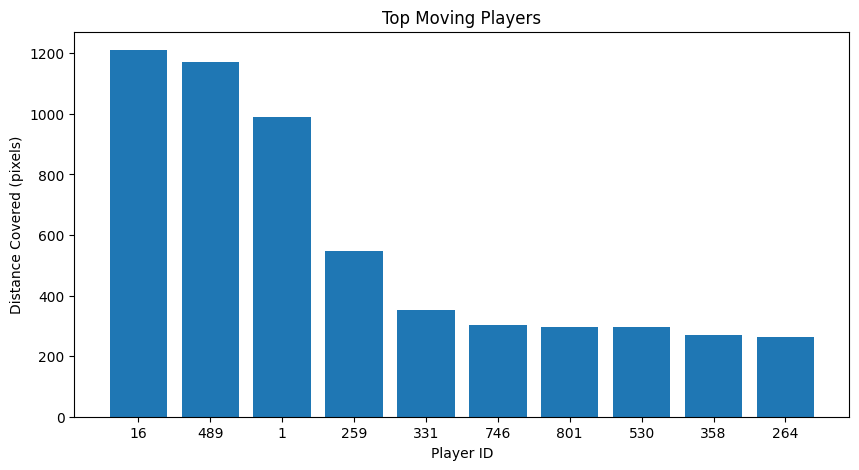

In [20]:
import matplotlib.pyplot as plt

top = analytics_df.sort_values(
    by='distance_pixels',
    ascending=False
).head(10)

plt.figure(figsize=(10,5))
plt.bar(top['player_id'].astype(str),
        top['distance_pixels'])
plt.xlabel("Player ID")
plt.ylabel("Distance Covered (pixels)")
plt.title("Top Moving Players")
plt.show()

In [21]:
from google.colab import files

files.download('/content/final_cricket_analytics.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
from google.colab import files

files.download('/content/Cricket_Analytics.ipynb')

FileNotFoundError: Cannot find file: /content/Cricket_Analytics.ipynb

In [23]:
!find /content -name "*.ipynb"

In [25]:
import zipfile

with zipfile.ZipFile('Cricket_Analytics.zip', 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write('Cricket_Performance_Analyst.ipynb')

print("Done")

FileNotFoundError: [Errno 2] No such file or directory: 'Cricket_Performance_Analyst.ipynb'